This notebook is a demo of the proposed framework's testing performance on Ego hands dataset. 
Make sure to download the test set (as instructed in the Repo's ReadMe) and update the following directory accordingly. Inference times vary depending on hardware specs. 

In [4]:
test_set_dir='Put test directory path here'
test_set_dir='C:/Users/OMID/Desktop/test_set'

In [7]:
from Utility05_Bayesian import *
# from bayes_opt import BayesianOptimization
from tiramisu_net import *
import scipy.io
import cv2
import multiprocessing
import tensorflow as tf

def make_di_path(path_name):
    try:
        os.mkdir(path_name)
    except OSError:
        print ("Creation of the directory %s failed" % path_name)
    else:
        print ("Successfully created the directory %s " % path_name)    

In [8]:
new_H=180
new_W=320
N_MCS=20

## Structure data

In [9]:
class Ego_data_split:
    
    def __init__(self,set_dir,n_obs,new_H=new_H,new_W=new_W):
        self.n_obs = n_obs
        self.set_dir = set_dir
        self.new_H = new_H
        self.new_W = new_W        

    def resize_data(data):
        
        return data_res
    
    def load_data(self,image_id, resize=True,verbose=0,
                  norm_RGB=255):
        mask_i = scipy.io.loadmat(self.set_dir+'/hand_mask_'+str(image_id+1)+'.mat')['hand_mask']
        img_i = scipy.io.loadmat(self.set_dir+'/img_'+str(image_id+1)+'.mat')['img']/norm_RGB
        
        if resize:
            mask_i = cv2.resize(np.array(mask_i), (self.new_W,self.new_H), interpolation =cv2.INTER_NEAREST)
            img_i = cv2.resize(np.array(img_i), (self.new_W,self.new_H), interpolation =cv2.INTER_NEAREST)
            
        if verbose==1:
            print('img_i.shape:  '+str(mask_i.shape))
            print('mask_i.shape: '+str(mask_i.shape))
            
        return mask_i,img_i    

In [10]:
test_set=Ego_data_split(test_set_dir,800)

In [11]:
class DataGenerator(tf.keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, set_dir, n_obs, class_weights, batch_size,
                 n_classes=5, shuffle=True, new_H=new_H, new_W=new_W):
        'Initialization'
        self.set_dir = set_dir
        self.batch_size = batch_size
        self.class_weights = class_weights
        self.n_obs = n_obs
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.on_epoch_end()
        self.new_H = new_H
        self.new_W = new_W

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(self.n_obs / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Generate data
        data_tuple = self.__data_generation(indexes)

        return data_tuple

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(self.n_obs)
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, indexes):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, self.new_H,self.new_W, 3))
        y = np.empty((self.batch_size, self.new_H,self.new_W), dtype=int)

        # Generate data
        for i, ID in enumerate(indexes):
            # Store sample
            img_i = scipy.io.loadmat(self.set_dir+'/img_'+str(ID+1)+'.mat')['img']/255
            X[i,] = cv2.resize(np.array(img_i), (self.new_W,self.new_H), interpolation =cv2.INTER_NEAREST)
            
            # Store class
            mask_i = scipy.io.loadmat(self.set_dir+'/hand_mask_'+str(ID+1)+'.mat')['hand_mask']
            y[i] = cv2.resize(np.array(mask_i), (self.new_W,self.new_H), interpolation =cv2.INTER_NEAREST)-1
         
        y_resh=y.reshape((-1,self.new_H*self.new_W))
#         print(np.amax(y_resh))
#         print(y_resh.shape)
        y_cat=tf.keras.utils.to_categorical(y_resh, num_classes=self.n_classes)
        batch_wieghts = gen_weight_mat(y,self.class_weights)
        

        return (X, y_cat,batch_wieghts)

## Inference

In [12]:
class Model:
    @staticmethod
    def loadmodel(path):
        return load_model(path)

    def __init__(self, path):
        self.model = self.loadmodel(path)
        self.graph = tf.compat.v1.get_default_graph()

    def predict(self, X):
        with self.graph.as_default():
            return self.model.predict(X)

In [13]:
tf.compat.v1.disable_eager_execution()
print(tf.compat.v1.get_default_graph())

In [14]:
main_model=Model('Ego_sp1.h5')
SRG_model=Model('Ego_SRG.h5')

Instructions for updating:
Colocations handled automatically by placer.


In [15]:
def Monty_Model_softmax_X(X,model, N_MCS):
    SoftMaxBin_list=[]
    for i in range(N_MCS):
        SoftMaxBin_list.append(model.predict(X))
    SoftMaxBin=np.array(SoftMaxBin_list)
    
    SoftmaxMean=np.mean(SoftMaxBin,axis=0)
    SoftmaxStd=np.std(SoftMaxBin,axis=0)

    return SoftmaxMean,SoftmaxStd

In [16]:
import glob
def get_Y(set_dir,new_H=new_H,new_W=new_W):
    obs_dir=glob.glob(set_dir+'/hand_mask_*')
    n_obs_set=len(obs_dir)
    y=np.empty((n_obs_set, new_H,new_W), dtype=int)
    for i_obs in range(n_obs_set):
        mask_i = scipy.io.loadmat(set_dir+'/hand_mask_'+str(i_obs+1)+'.mat')['hand_mask']
        y[i_obs] = cv2.resize(np.array(mask_i), (new_W,new_H), interpolation =cv2.INTER_NEAREST)-1

#     y[y>1]=1
#     y_resh=y.reshape((-1,new_H*new_W))
    print(y.shape)
    return y

In [17]:
# y_gt_test=get_Y('../../dataset/03_test')

### Visualization

In [18]:
import time

N_MCS_main=20
N_MCS_SRG=1

In [19]:
make_di_path('test_save')

Creation of the directory test_save failed


C:\Users\OMID\.conda\envs\tf26\lib\site-packages\keras\engine\training_v1.py:2079: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


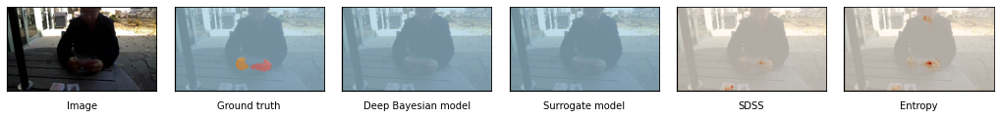

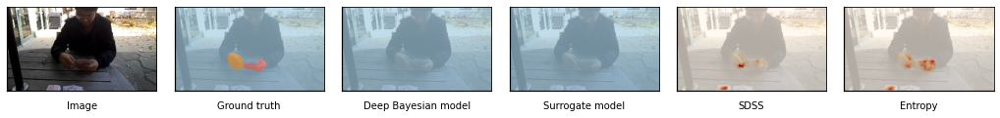

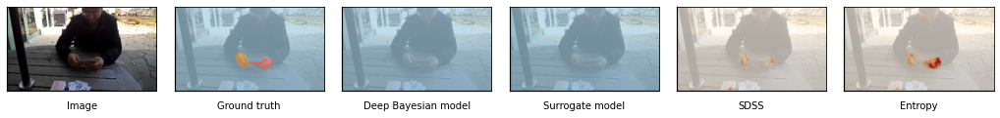

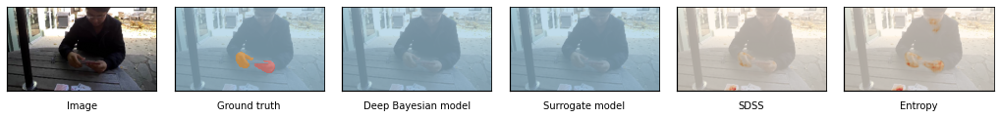

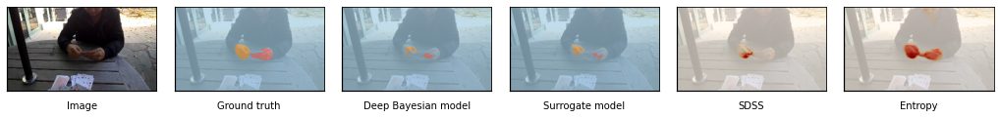

...

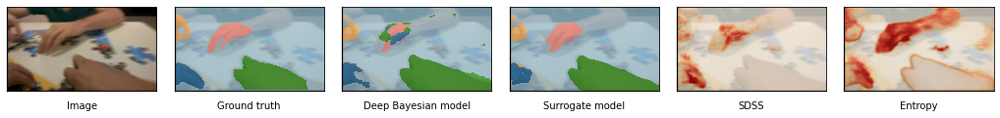

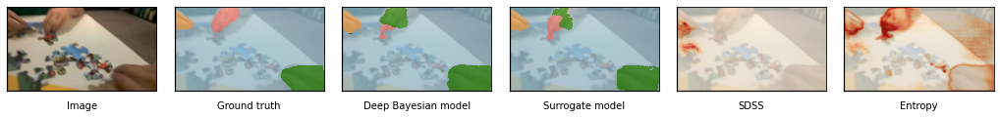

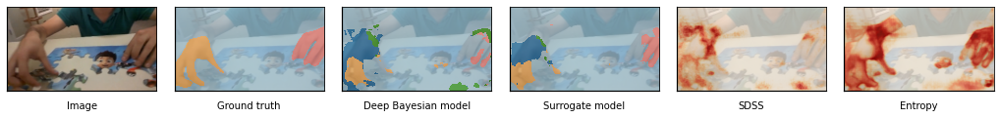

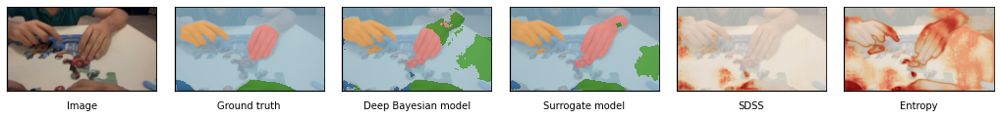

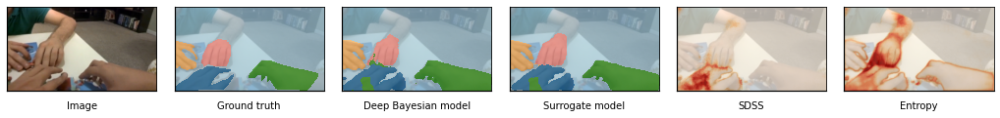

In [20]:
data_set=test_set

t_bin=[]

alpha=0.7


for i_obs in np.arange(0,800,5):
    
    t0 = time.time() ## initiate data loading 
    mask_i,img_i = data_set.load_data(i_obs,verbose=0,resize=True)
    img_i=img_i.reshape((1,)+img_i.shape)
    mask_i=mask_i.reshape((1,)+mask_i.shape)

#     mask_i[mask_i>2]=2
    
    t1 = time.time() ## initiate MCS
    SoftmaxMean_main_i,SoftmaxStd_main_i=Monty_Model_softmax_X(img_i,main_model, N_MCS_main)
    
    
    
    t2 = time.time() ## entropy calcs

    p_c=SoftmaxMean_main_i
    max_p=np.sum(SoftmaxMean_main_i,axis=-1)
    max_p=np.reshape(max_p,max_p.shape+(1,))
    p_c_norm=np.divide(p_c,max_p)
    log_p_c=np.log10(p_c_norm+1e-12)
    entropy_i=np.sum(np.multiply(-1*p_c_norm,log_p_c),axis=-1)

    t3 = time.time() ## save to file
    SoftmaxStd_main_i=SoftmaxStd_main_i.reshape(1,data_set.new_H,data_set.new_W,5)
    SoftmaxMean_main_i=SoftmaxMean_main_i.reshape(1,data_set.new_H,data_set.new_W,5)
    entropy_i=entropy_i.reshape((1,data_set.new_H,data_set.new_W,1))
    X_SRG=np.concatenate((img_i,SoftmaxMean_main_i,SoftmaxStd_main_i,entropy_i),axis=-1) 

    y_pred_main=np.argmax(SoftmaxMean_main_i,axis=-1)
    
    # np.savez_compressed(set_dir+'/X_SRG_'+str(i_obs+1)+'.npz',X_SRG=X_SRG)

    t4 = time.time() ## Initiate second inference
    
    SoftmaxMean_SRG_i,SoftmaxStd_SRG_i=Monty_Model_softmax_X(X_SRG,SRG_model, N_MCS_SRG)
    
    y_pred_SRG=np.argmax(SoftmaxMean_SRG_i,axis=-1).reshape(1,data_set.new_H,data_set.new_W)
    
    t5 = time.time() ## End of inference 
    
    # times
    dt_1=t1-t0  # load data
    dt_2=t2-t1  # perform MCS
    dt_3=t3-t2  # measure entropy
    dt_4=t4-t3  # Build SRG input
    dt_5=t5-t4  # SRG inference
    t_sum=t5-t0
    
    t_bin.append([dt_1,dt_2,dt_3,dt_4,dt_5])
#     print('Obs. %d processed, t_load: %1.3f, t_MCS: %1.3f, t_ENTP: %1.3f, t_inSRG: %1.3f, t_SRG: %1.3f t_sum= %1.3f (s)'%((i_obs+1,dt_1,dt_2,dt_3,dt_4,dt_5,t_sum)))
    
    fig,ax = plt.subplots(1,6,figsize=(18,3))
    plt.subplots_adjust(wspace=0.12, hspace=0.1)
    
    for i in range(6):
        ax[i].spines['top'].set_visible(1.2)
        ax[i].spines['right'].set_visible(1.2)
        ax[i].spines['bottom'].set_linewidth(1.2)
        ax[i].spines['left'].set_linewidth(1.2)
        ax[i].set_yticklabels([])
        ax[i].set_xticklabels([])
        ax[i].tick_params(bottom=False, left=False)
    
    ax[0].imshow(img_i[0])
    ax[0].set_xlabel('Image')

    ax[1].imshow(img_i[0])
    ax[1].imshow(mask_i[0]-1,alpha=alpha,cmap='Paired',vmin=0,vmax=8,interpolation='nearest')
    ax[1].set_xlabel('Ground truth')
    
    ax[2].imshow(img_i[0])
    ax[2].imshow(y_pred_main[0],alpha=alpha,cmap='Paired',vmin=0,vmax=8,interpolation='nearest')
    ax[2].set_xlabel('Deep Bayesian model')

    ax[3].imshow(img_i[0])
    ax[3].imshow(y_pred_SRG[0],alpha=alpha,cmap='Paired',vmin=0,vmax=8,interpolation='nearest')
    ax[3].set_xlabel('Surrogate model')
    
    ax[4].imshow(img_i[0])
    ax[4].imshow(SoftmaxStd_main_i[0,:,:,1],alpha=alpha,cmap='OrRd')
    ax[4].set_xlabel('SDSS')    
    
    ax[5].imshow(img_i[0])
    ax[5].imshow(entropy_i[0,:,:,0],alpha=alpha,cmap='OrRd')
    ax[5].set_xlabel('Entropy')    
    
    
    plot_save_name='test_save/'+str(i_obs+1).zfill(3)+'.png'
    fig.savefig(plot_save_name,dpi=150, pad_inches=0.1,bbox_inches='tight',facecolor='white')   
    
    plt.show()
    plt.close()